/home/u4/csmi/2024/sarr/feelpp-scimba/.venv/lib/python3.10/site-packages/pandas/core/arrays/masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


Using device: cpu


/home/u4/csmi/2024/sarr/feelpp-scimba/.venv/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


torch loaded; device is cpu


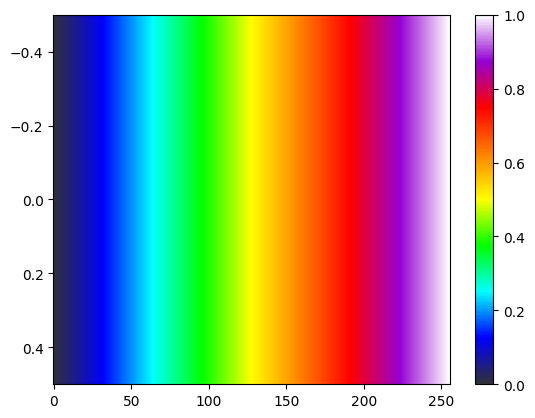

[ Starting Feel++ ] application feelpp_app version 0.1 date 2025-May-19
 . feelpp_app files are stored in /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1
 .. logfiles :/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/logs


In [1]:
import sys
import feelpp.core as fppc
import feelpp.toolboxes.core as tb
import pandas as pd
import numpy as np
from feelpp.scimba.Poisson import Poisson, runLaplacianPk, runConvergenceAnalysis, plot_convergence,plot_scimba_convergence, custom_cmap

sys.argv = ["feelpp_app"]
e = fppc.Environment(sys.argv,
                       opts=tb.toolboxes_options("coefficient-form-pdes", "cfpdes"),
                       config=fppc.localRepository('feelpp_cfpde'))

# ------------------------------------------------------------------------- #
# Poisson problem
# - div (diff * grad (u)) = f    in Omega
#                     u   = g    in Gamma_D
# Omega = domain, either cube or ball
# Approx = lagrange Pk of order order
# mesh of size h

P = Poisson(dim = 2)



In [2]:



u_exact = 'sin(pi*x) * sin(pi*y)'
grad_u_exact='{pi*cos(pi*x)*sin(pi*y),pi*sin(pi*x)*cos(pi*y)}'
rhs = '2*pi*pi*sin(pi*x) * sin(pi*y)'

#P(rhs=rhs, g='0', solver ='scimba', u_exact = u_exact)
#P(h=0.1,  rhs=rhs, g='0', solver ='feelpp', u_exact = u_exact)

mesh_size= [0.1, 0.05, 0.025, 0.0125, 0.00625]
measures = []

for h in mesh_size:
  P(h, rhs=rhs, g='0', plot=None ,  u_exact = u_exact,grad_u_exact=grad_u_exact)
  measures.append(P.measures)

print(measures)

# Plotting the error convergence rates
poisson_json = P.model
df= runConvergenceAnalysis(P, json=poisson_json, measures=measures, dim=2, hs= mesh_size,verbose=True)
print('measures = ', measures)
fig= plot_convergence(P, df,dim=2)
fig.show()


Solving the laplacian problem for h = 0.1...
generate mesh omega-2.geo with h=0.1 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.1 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +----------------------------------------------------------------------------------------------------+                                             |
| | Environment                          

In [ ]:
u_exact = 'sin(pi*x) * sin(pi*y)'
#grad_u_exact='{pi*cos(pi*x)*sin(pi*y),pi*sin(pi*x)*cos(pi*y)}'
rhs = '2*pi*pi*sin(pi*x) * sin(pi*y)'

P(rhs=rhs, g='0', solver ='scimba', u_exact = u_exact)
#P(rhs=rhs, g='0', solver ='feelpp', u_exact = u_exact)


Solving the laplacian problem for h = 0.05...
generate mesh omega-2.geo with h=0.05 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.05 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +----------------------------------------------------------------------------------------------------+                                             |
| | Environment                       

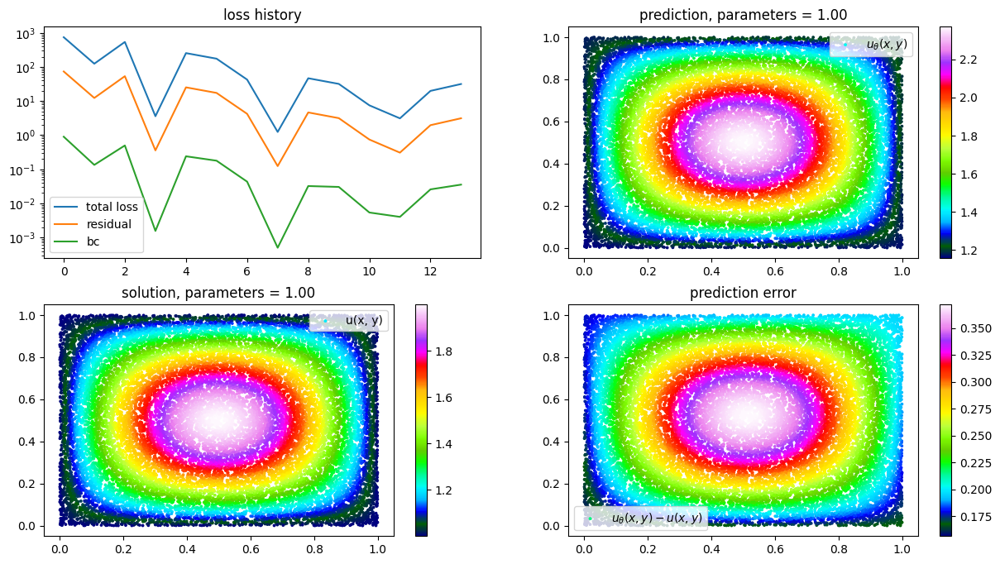

                          0
0  cfpdes.expr.grad_u_exact
1           cfpdes.expr.rhs
2       cfpdes.expr.u_exact
3          cfpdes.poisson.u
Number of features in coordinates: 3
Number of points: 517

Nodes from export.case: [[0.82477343 0.04606718]
 [0.8300841  0.10191753]
 [0.7806651  0.09123866]
 ...
 [0.8390992  0.3016979 ]
 [0.8367227  0.1427201 ]
 [0.7476512  0.5844005 ]]

Feel++ solution 'cfpdes.poisson.u':
[1.0753812 1.1605104 1.179705  1.1745708 1.2549863 1.1277226 1.
 1.1127427 1.1153023 1.1110775 1.1125722 1.        1.2139456 1.0842546
 1.0870736 1.0811214 1.0302912 1.0534257 1.0813794 1.1162078 1.2586697
 1.2684876 1.2605863 1.4037929 1.404037  1.3276601 1.2109686 1.2409786
 1.2566029 1.367851  1.1303743 1.1085224 1.3991121 1.2663145 1.1543422
 1.2639493 1.1296023 1.1068265 1.2085572 1.1020663 1.1561056 1.0722841
 1.2899373 1.13614   1.2729714 1.1824378 1.0816841 1.0918428 1.0347171
 1.2240033 1.2052656 1.        1.        1.1403087 1.2338159 1.3020989
 1.255449  1.3611581 1

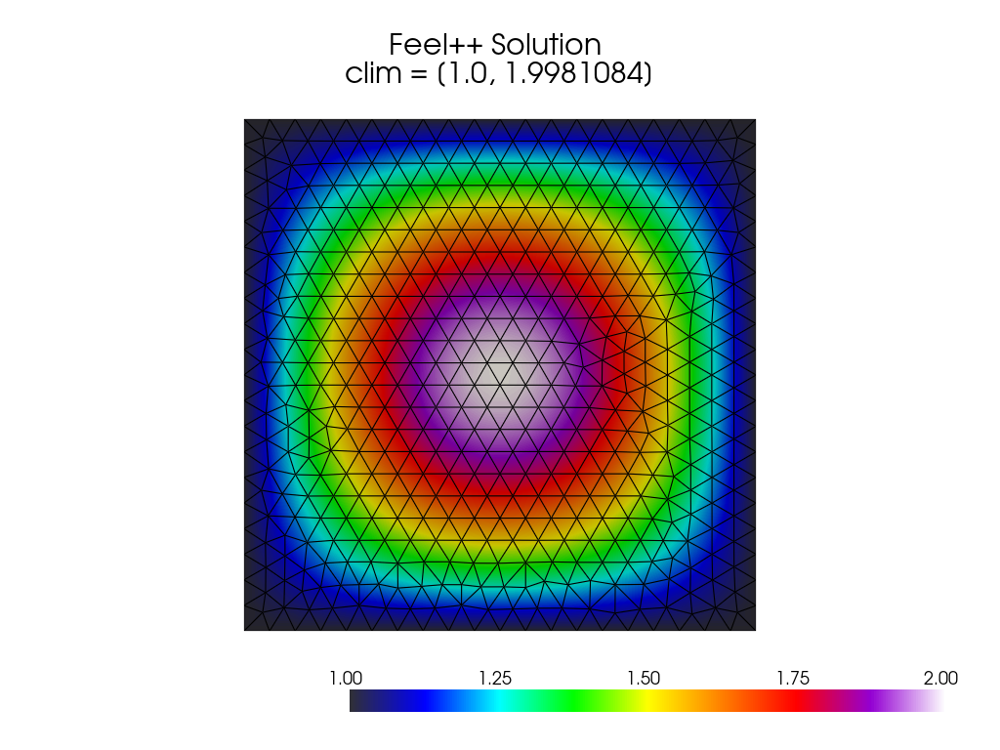

clim scimba =  [1.1563408899912395, 2.3680073220602265]


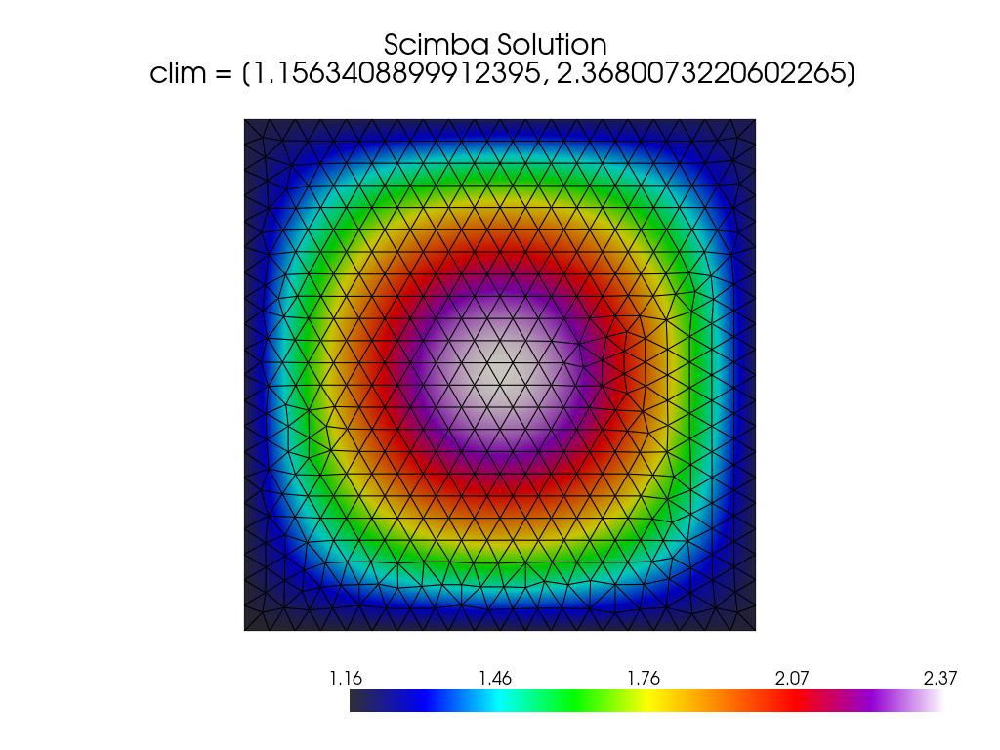

clim exact =  [1.0, 1.9981017]


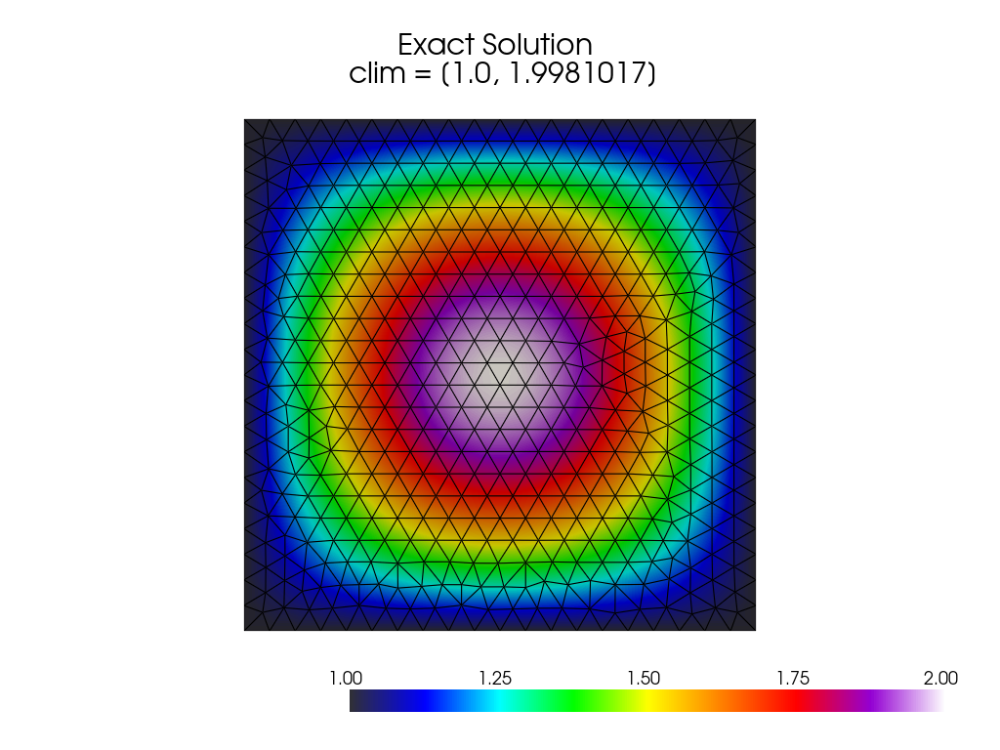

L2 error of scimba 0.18261969871340383
clim err_feel = |u_feel - u_exact|/|u_exact| ∈  [0.0, 0.0005847178]


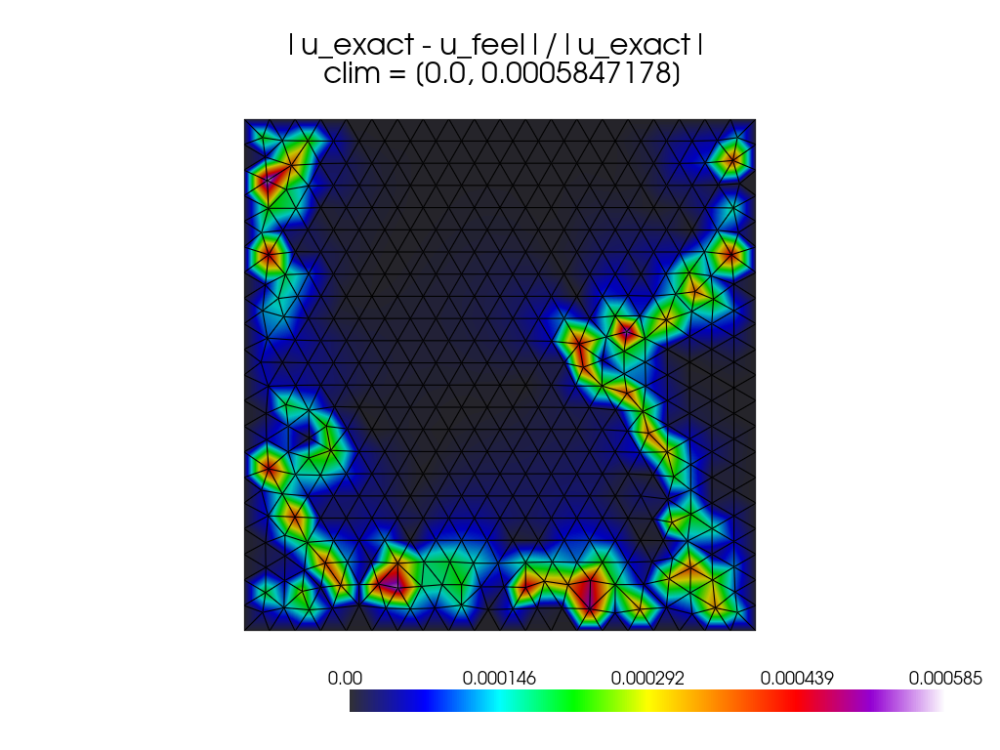

clim err_scimba = |u_scimba - u_exact|/|u_exact| ∈  [0.15634088999123952, 0.19546088254898897]


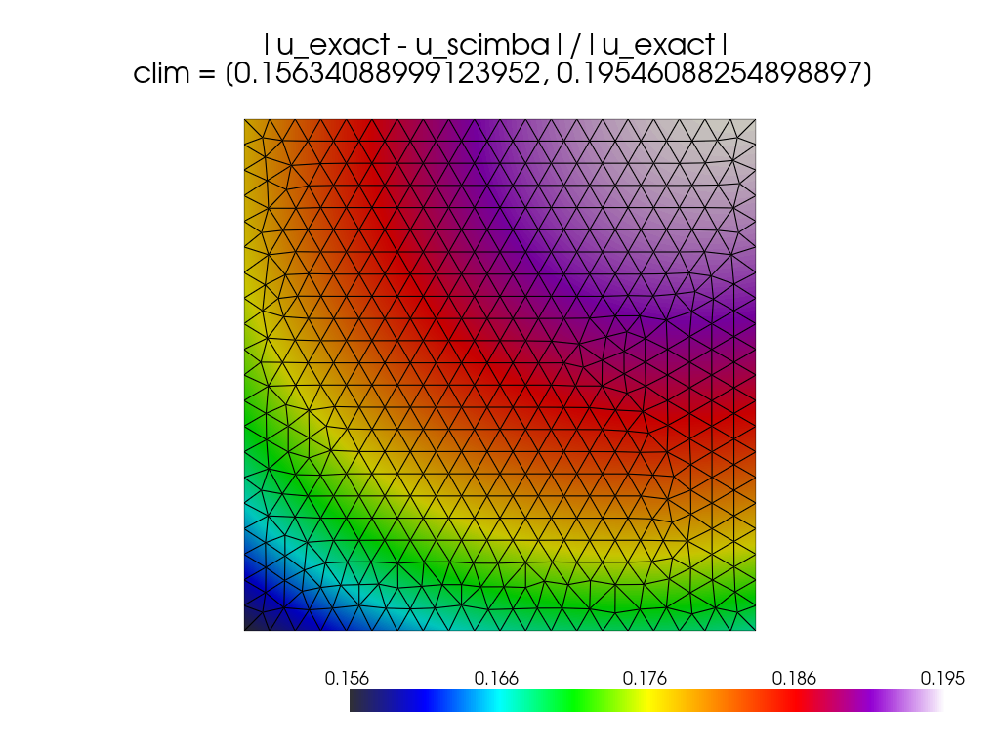

 ||u_feel - u_exact||∞ =  0.0009689331
 ||u_scimba - u_exact||∞ =  0.371853632778131
Solving the laplacian problem for h = 0.05...
generate mesh omega-2.geo with h=0.05 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.05 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +----------------------------------------------------------------------------------------------------+

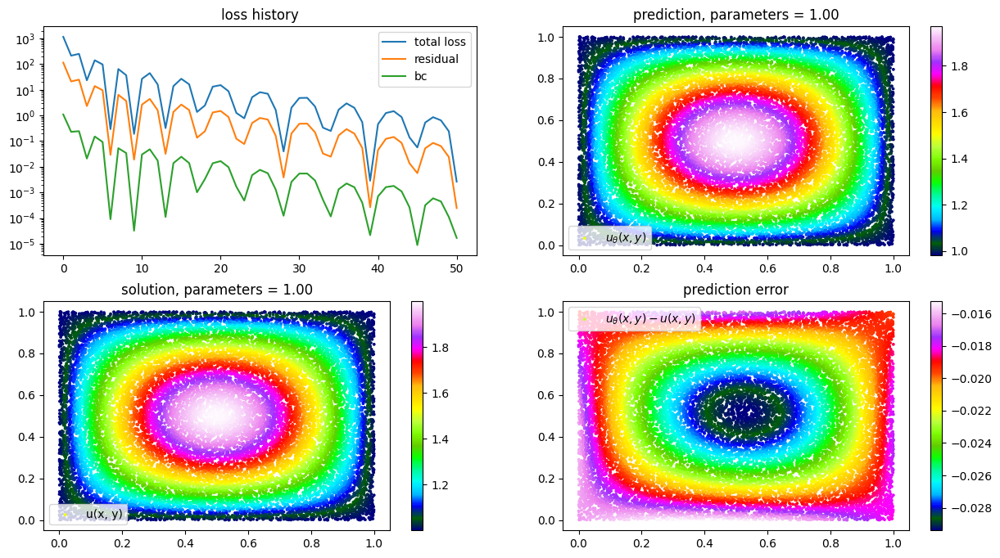

                          0
0  cfpdes.expr.grad_u_exact
1           cfpdes.expr.rhs
2       cfpdes.expr.u_exact
3          cfpdes.poisson.u
Number of features in coordinates: 3
Number of points: 517

Nodes from export.case: [[0.82477343 0.04606718]
 [0.8300841  0.10191753]
 [0.7806651  0.09123866]
 ...
 [0.8390992  0.3016979 ]
 [0.8367227  0.1427201 ]
 [0.7476512  0.5844005 ]]

Feel++ solution 'cfpdes.poisson.u':
[1.0753812 1.1605104 1.179705  1.1745708 1.2549863 1.1277226 1.
 1.1127427 1.1153023 1.1110775 1.1125722 1.        1.2139456 1.0842546
 1.0870736 1.0811214 1.0302912 1.0534257 1.0813794 1.1162078 1.2586697
 1.2684876 1.2605863 1.4037929 1.404037  1.3276601 1.2109686 1.2409786
 1.2566029 1.367851  1.1303743 1.1085224 1.3991121 1.2663145 1.1543422
 1.2639493 1.1296023 1.1068265 1.2085572 1.1020663 1.1561056 1.0722841
 1.2899373 1.13614   1.2729714 1.1824378 1.0816841 1.0918428 1.0347171
 1.2240033 1.2052656 1.        1.        1.1403087 1.2338159 1.3020989
 1.255449  1.3611581 1

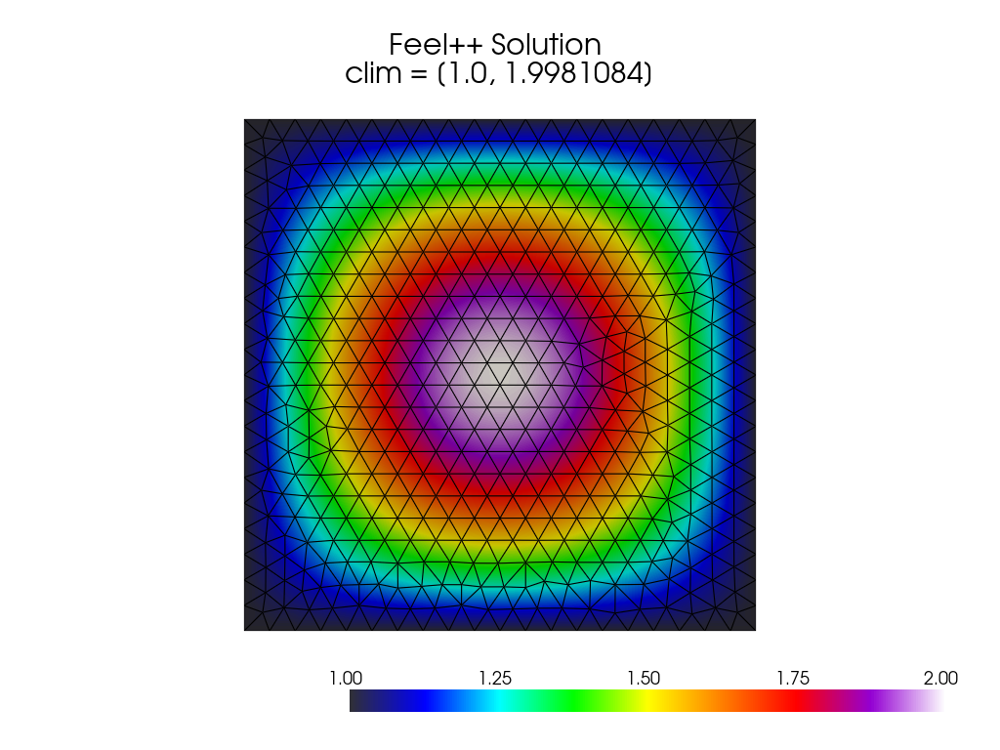

clim scimba =  [0.9803194370613078, 1.9688247310290221]


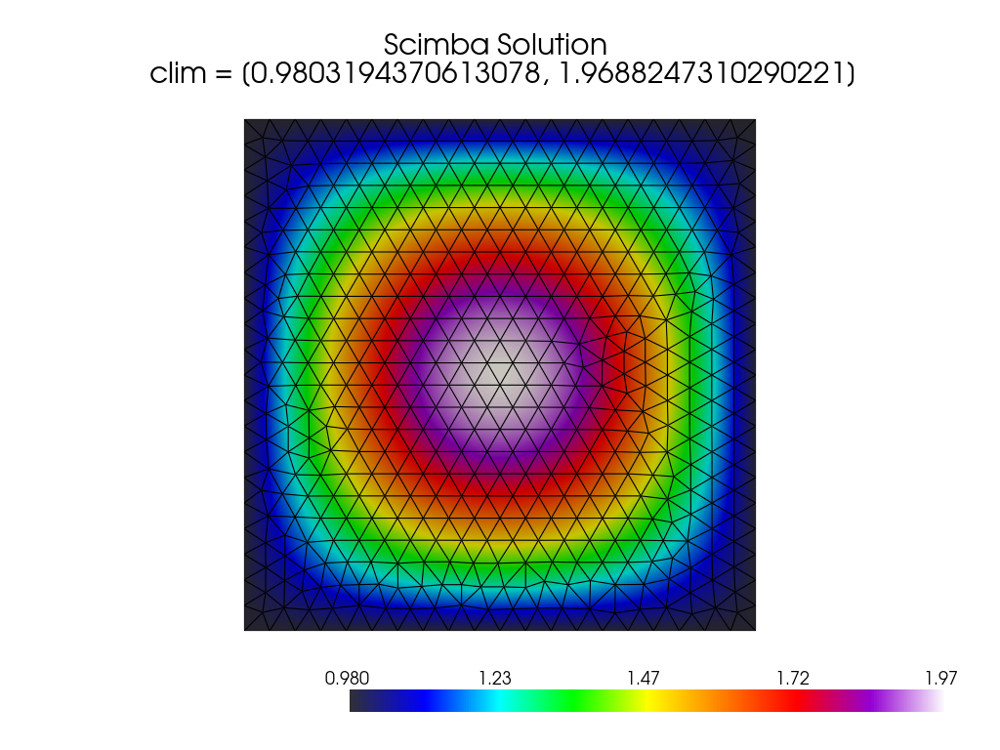

clim exact =  [1.0, 1.9981017]


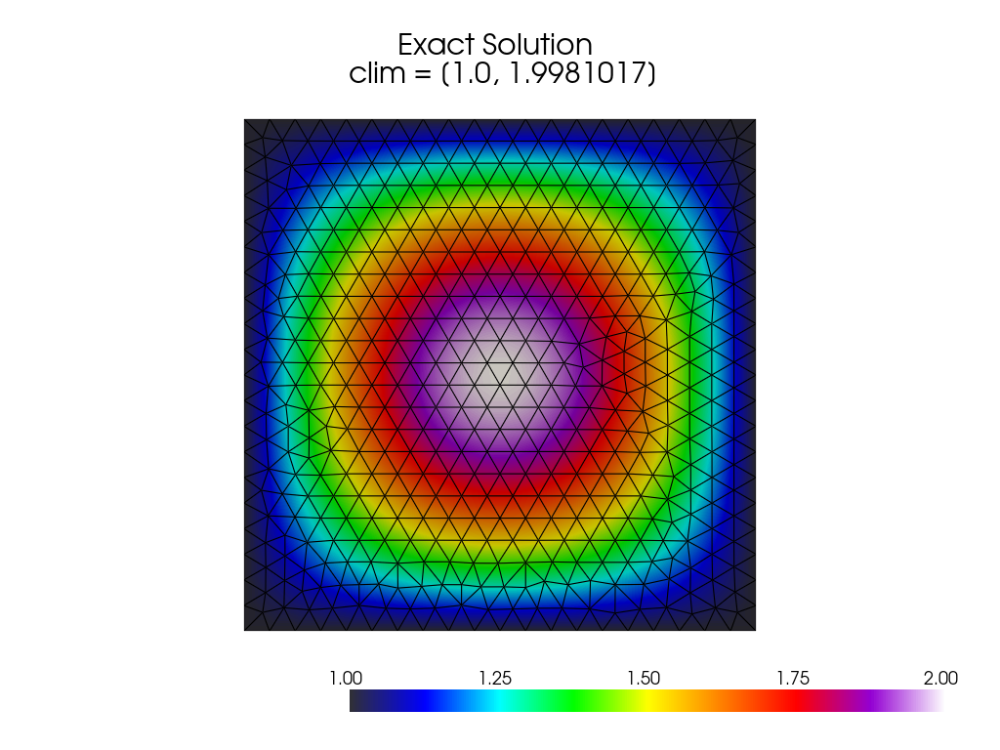

L2 error of scimba 0.015711628316739057
clim err_feel = |u_feel - u_exact|/|u_exact| ∈  [0.0, 0.0005847178]


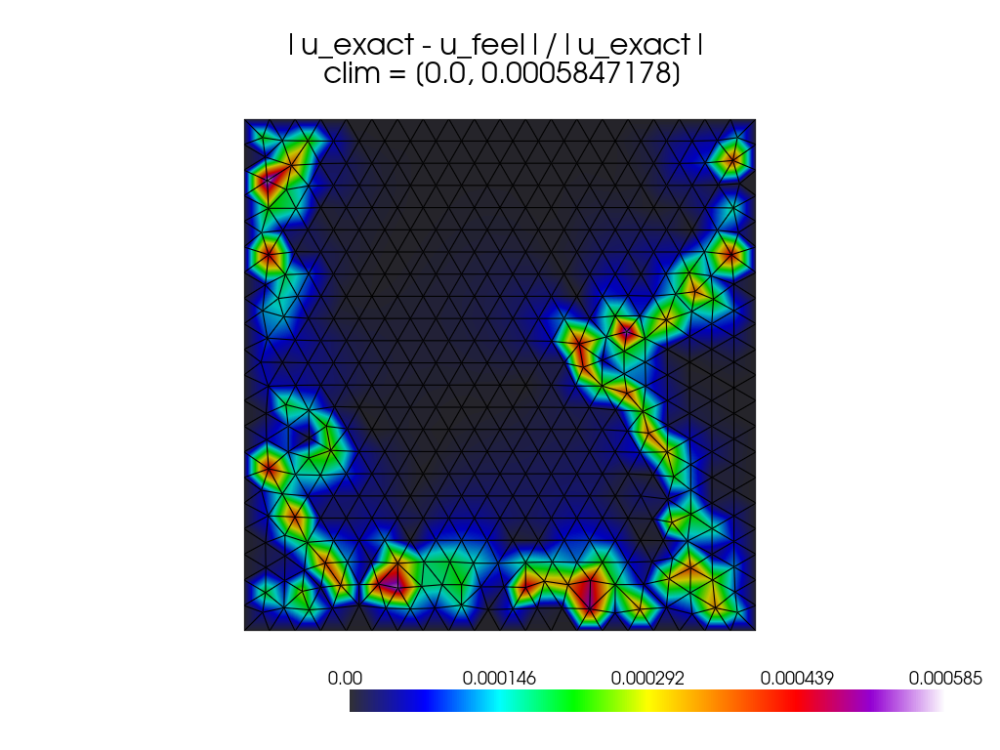

clim err_scimba = |u_scimba - u_exact|/|u_exact| ∈  [0.01454987381717761, 0.019680562938692248]


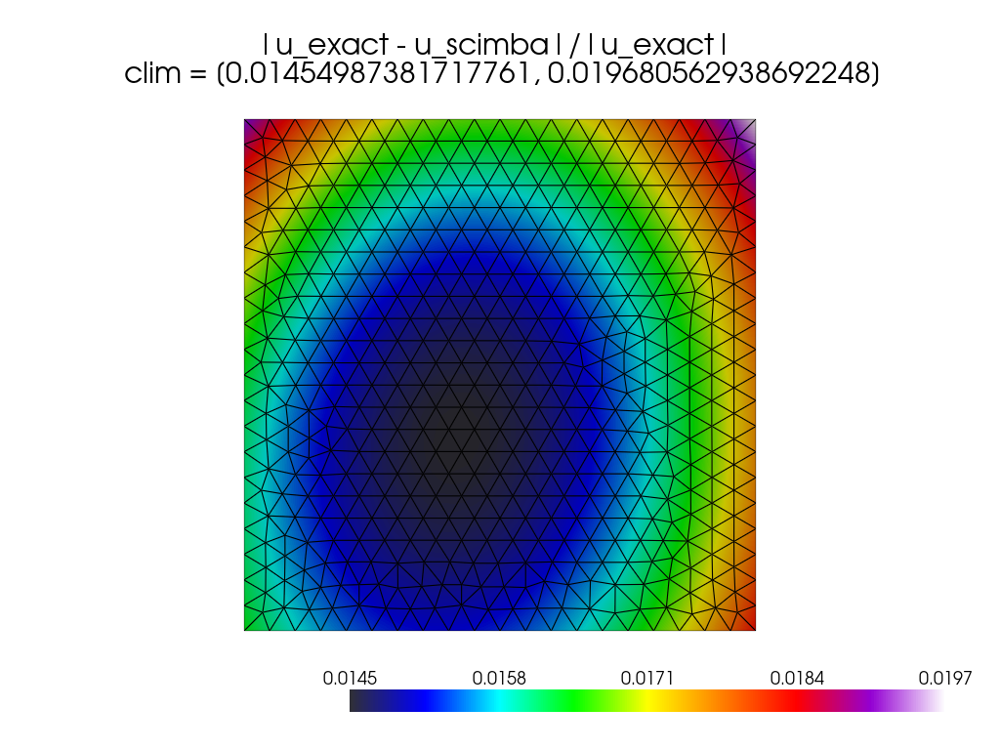

 ||u_feel - u_exact||∞ =  0.0009689331
 ||u_scimba - u_exact||∞ =  0.029400248055801548
Solving the laplacian problem for h = 0.05...
generate mesh omega-2.geo with h=0.05 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.05 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +--------------------------------------------------------------------------------------------------

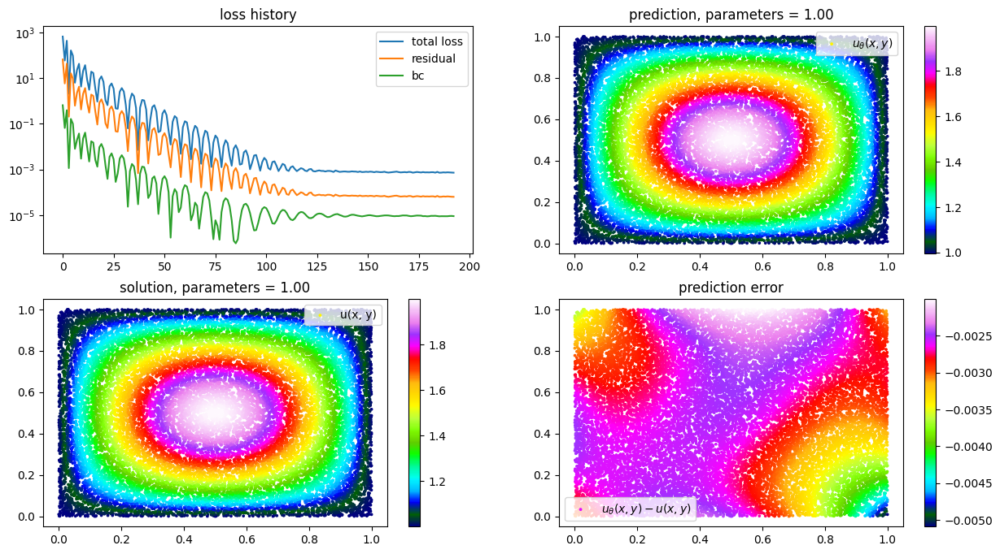

                          0
0  cfpdes.expr.grad_u_exact
1           cfpdes.expr.rhs
2       cfpdes.expr.u_exact
3          cfpdes.poisson.u
Number of features in coordinates: 3
Number of points: 517

Nodes from export.case: [[0.82477343 0.04606718]
 [0.8300841  0.10191753]
 [0.7806651  0.09123866]
 ...
 [0.8390992  0.3016979 ]
 [0.8367227  0.1427201 ]
 [0.7476512  0.5844005 ]]

Feel++ solution 'cfpdes.poisson.u':
[1.0753812 1.1605104 1.179705  1.1745708 1.2549863 1.1277226 1.
 1.1127427 1.1153023 1.1110775 1.1125722 1.        1.2139456 1.0842546
 1.0870736 1.0811214 1.0302912 1.0534257 1.0813794 1.1162078 1.2586697
 1.2684876 1.2605863 1.4037929 1.404037  1.3276601 1.2109686 1.2409786
 1.2566029 1.367851  1.1303743 1.1085224 1.3991121 1.2663145 1.1543422
 1.2639493 1.1296023 1.1068265 1.2085572 1.1020663 1.1561056 1.0722841
 1.2899373 1.13614   1.2729714 1.1824378 1.0816841 1.0918428 1.0347171
 1.2240033 1.2052656 1.        1.        1.1403087 1.2338159 1.3020989
 1.255449  1.3611581 1

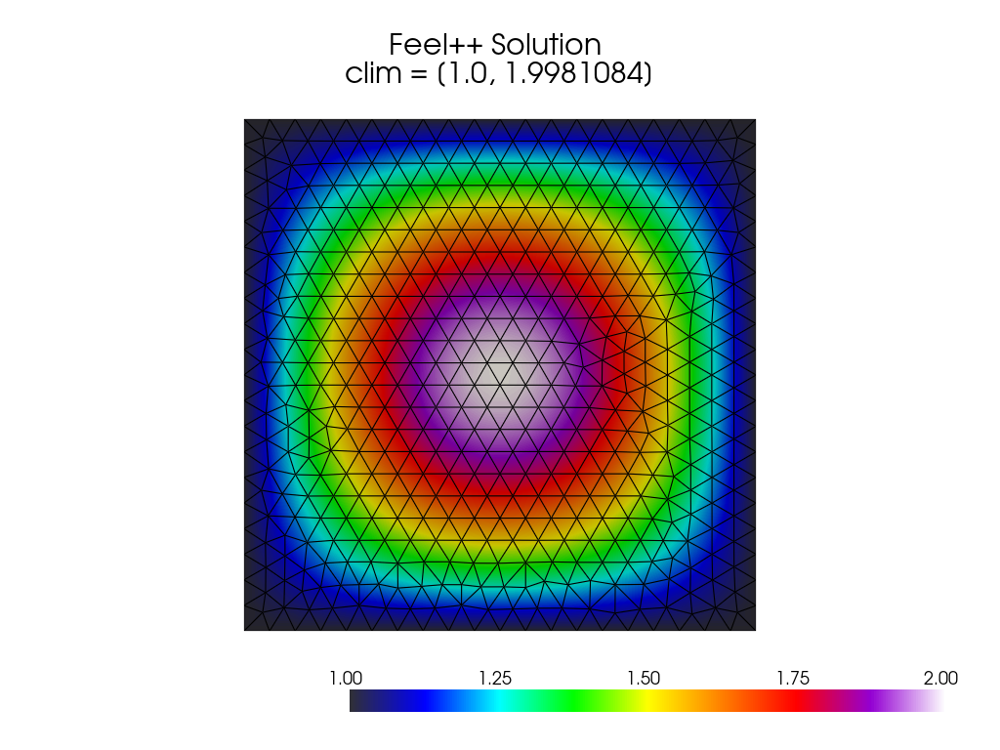

clim scimba =  [0.9948424783005594, 1.995585213154552]


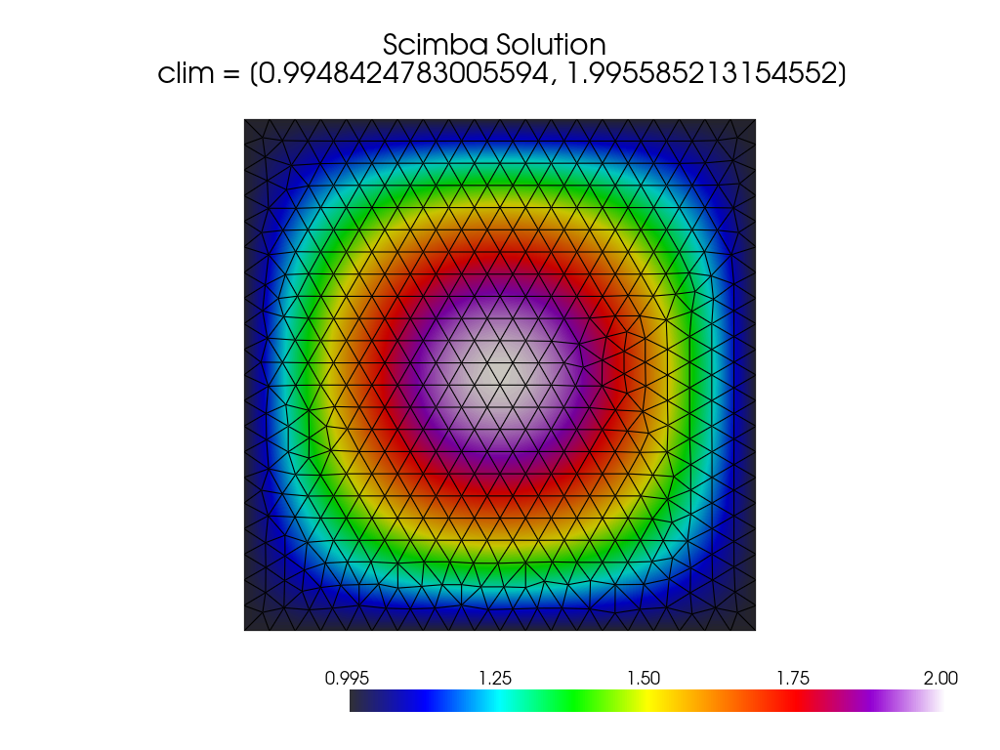

clim exact =  [1.0, 1.9981017]


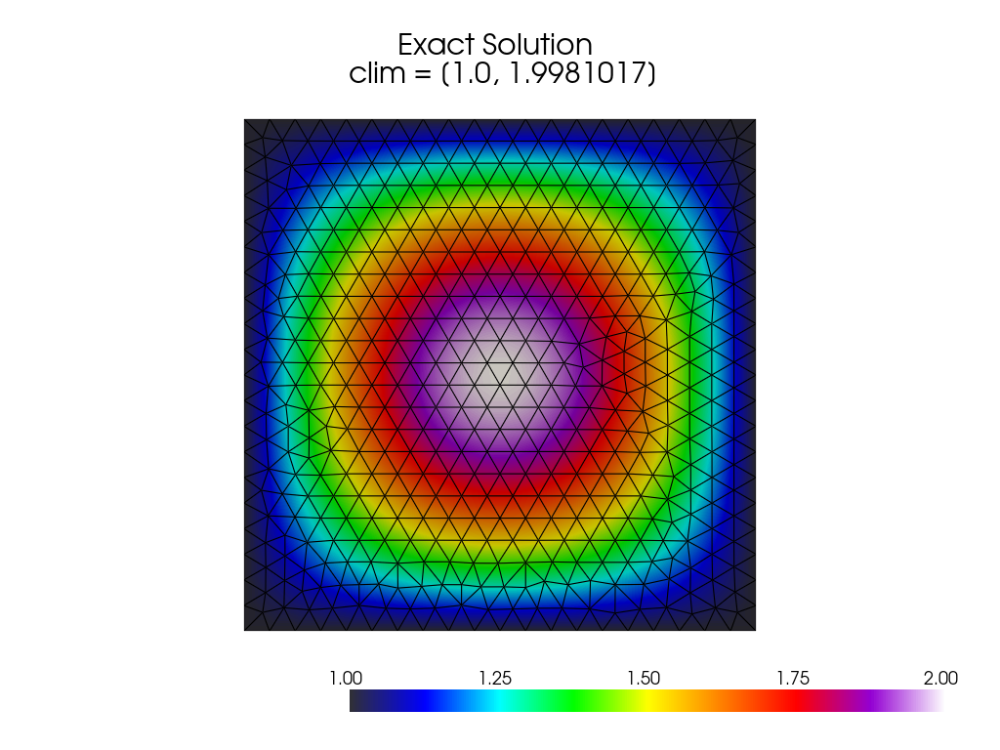

L2 error of scimba 0.0020108272581719072
clim err_feel = |u_feel - u_exact|/|u_exact| ∈  [0.0, 0.0005847178]


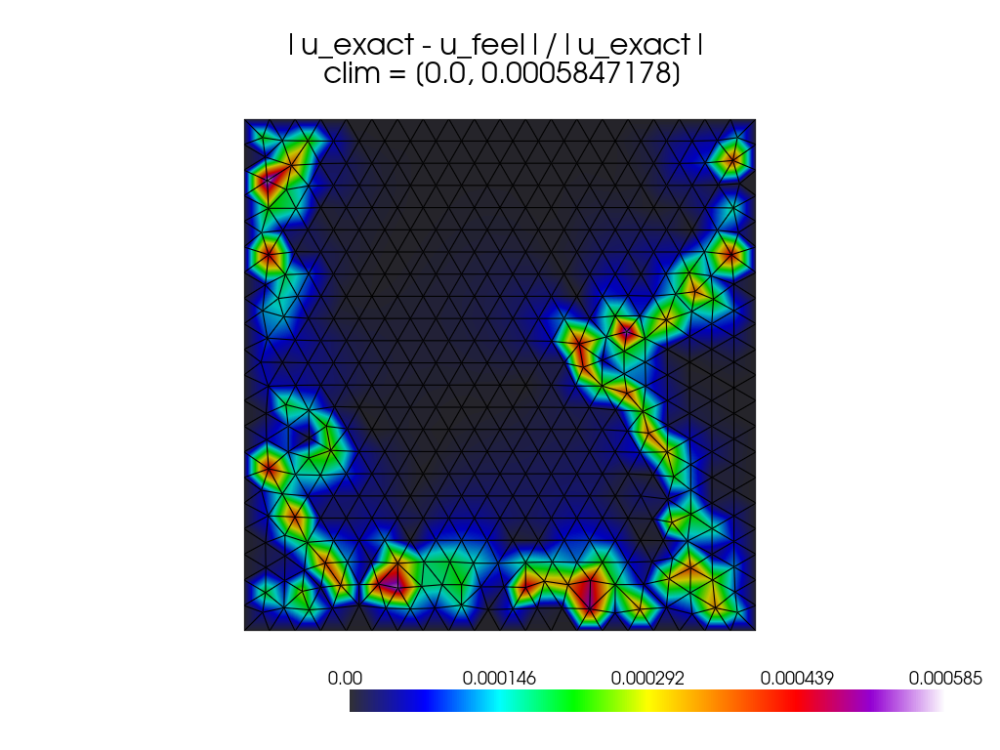

clim err_scimba = |u_scimba - u_exact|/|u_exact| ∈  [0.0012508288696045475, 0.005157521699440615]


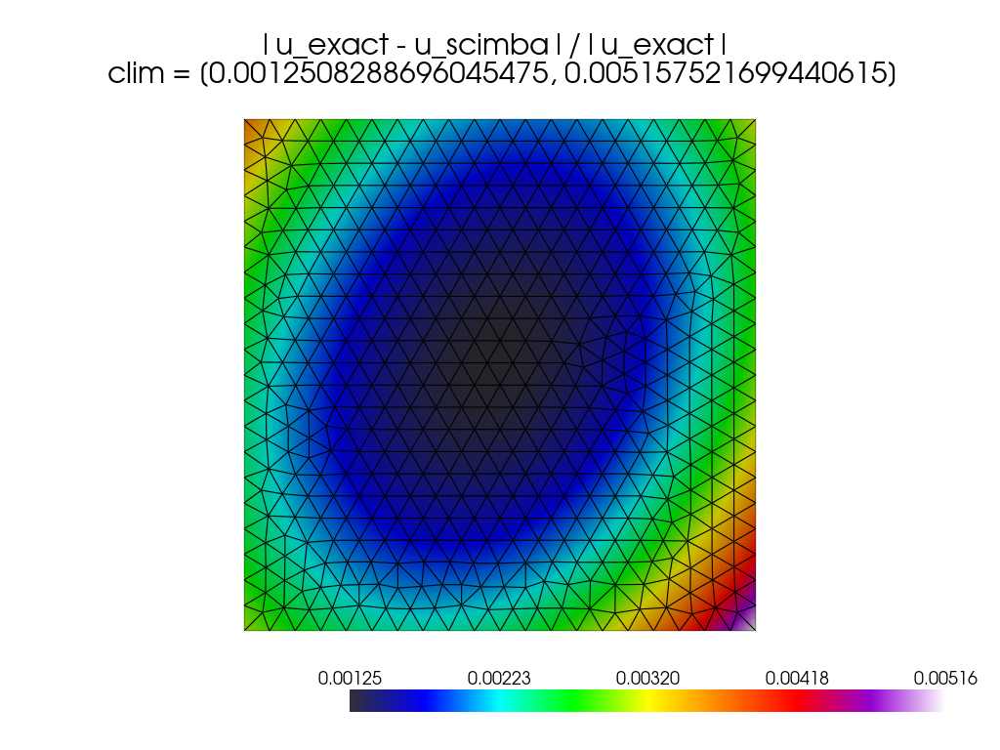

 ||u_feel - u_exact||∞ =  0.0009689331
 ||u_scimba - u_exact||∞ =  0.005157521699440615
[0.18261969871340383, 0.015711628316739057, 0.0020108272581719072]


In [3]:
u_exact = 'sin(pi*x) * sin(pi*y)+1'
grad_u_exact='{pi*cos(pi*x)*sin(pi*y),pi*sin(pi*x)*cos(pi*y)}'
rhs = '2*pi*pi*sin(pi*x) * sin(pi*y)'

scimba_errors = []
nb_coll= [145,517,1932]

for i in nb_coll:
  P( rhs=rhs, g='1', plot=None ,solver='scimba',  u_exact = u_exact,grad_u_exact=grad_u_exact,nb_coll=i)
  scimba_errors.append(P.errl2_scimba)
print(scimba_errors)

In [4]:
df_scimba = pd.DataFrame({'nb_coll': nb_coll, 'Scimba_L2_error': scimba_errors})
df_scimba['convergence_rate'] = np.log2(df_scimba['Scimba_L2_error'].shift() / df_scimba['Scimba_L2_error']) / np.log2(df_scimba['nb_coll'].shift() / df_scimba['nb_coll'])

fig = plot_scimba_convergence(df_scimba) 
fig.show()